## Problème non supervisé ##

In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

In [2]:
data = pd.read_csv('plot_data.csv')

In [3]:
data.shape

(22725, 6)

In [4]:
data

,Opened Programs,Frame Number,Eye Aspect Ratio,Mouth Aspect Ratio,Head Tilt Degree,Eye Pupil
0,1,5,0.288029,0.683386,0.518621,0.581871
1,1,6,0.322586,0.651688,0.519213,0.594595
2,1,7,0.300121,0.673784,0.517741,0.573613
3,1,8,0.211984,0.669791,0.513557,NaN
4,1,9,0.294016,0.659469,0.516893,0.541667
...,...,...,...,...,...,...
22720,24,1178,0.151834,0.721892,0.480175,0.699134
22721,24,1179,0.151995,0.715136,0.478147,NaN
22722,24,1180,0.138886,0.715830,0.470796,NaN
22723,24,1181,0.152112,0.711149,0.476651,NaN


## Null values imputation with KNN imputer

In [5]:
feature_with_null = "Eye Pupil"

# Creating a new DataFrame with only the feature containing null values
data_missing = data[[feature_with_null]]

# Initializing the KNNImputer
imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Performing imputation on the selected feature
data_imputed = pd.DataFrame(imputer.fit_transform(data_missing), columns=[feature_with_null])

# Updating the original DataFrame with the imputed values
data[feature_with_null] = data_imputed[feature_with_null]


In [6]:
data.isnull().sum()

Opened Programs       0
Frame Number          0
Eye Aspect Ratio      0
Mouth Aspect Ratio    0
Head Tilt Degree      0
Eye Pupil             0
dtype: int64

In [7]:
#sns.pairplot(data)

In [8]:
data.describe()

,Opened Programs,Frame Number,Eye Aspect Ratio,Mouth Aspect Ratio,Head Tilt Degree,Eye Pupil
count,22725.000000,22725.000000,22725.000000,22725.000000,22725.000000,22725.000000
mean,16.486953,916.851837,0.259675,0.695593,0.514202,0.646630
std,5.417702,645.866248,0.050586,0.039564,0.015832,0.051502
min,1.000000,0.000000,0.085496,0.338635,0.001031,0.314622
25%,14.000000,341.000000,0.226670,0.679555,0.511286,0.623118
50%,18.000000,841.000000,0.268311,0.697410,0.516307,0.646630
75%,20.000000,1434.000000,0.292385,0.712399,0.520130,0.673077
max,24.000000,2328.000000,0.511208,0.996883,0.861763,1.050000


In [9]:
scaler = StandardScaler()
features = data[['Eye Aspect Ratio', 'Mouth Aspect Ratio', 'Head Tilt Degree', 'Eye Pupil']]

In [10]:
#scaler = StandardScaler()
features_standardized = scaler.fit_transform(features)


In [11]:

num_components = 3

# Apply PCA
pca = PCA(n_components=num_components)
features_pca = pca.fit_transform(features_standardized)

# Create a DataFrame with the reduced features
data_pca = pd.DataFrame(data=features_pca, columns=['PCA_Component1', 'PCA_Component2','PCA_Component3'])

# Concatenate the reduced features with the original DataFrame
data = pd.concat([data, data_pca], axis=1)

In [12]:
def remove_outliers(data,X):
    column_data = data[X]
    Q1 = column_data.quantile(0.25)
    Q3 = column_data.quantile(0.75)
    IQR = Q3 - Q1

    # Step 3: Define the lower and upper bounds to identify outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Step 4: Identify and remove outliers from the DataFrame
    outliers = data[(column_data < lower_bound) | (column_data > upper_bound)]
    Train = data[(column_data >= lower_bound) & (column_data <= upper_bound)]
    return Train
data=remove_outliers(data,'Eye Aspect Ratio')
data=remove_outliers(data,'Mouth Aspect Ratio')
data=remove_outliers(data,'Head Tilt Degree')
data=remove_outliers(data,'Eye Pupil')

## GMM ##

In [13]:
new_data=data.drop(['Opened Programs','Frame Number','PCA_Component1','PCA_Component2','PCA_Component3'],axis=1)

In [14]:
# import optuna
# from sklearn.mixture import GaussianMixture
# from sklearn.metrics import silhouette_score
# import pandas as pd
# import plotly.express as px


# # Fonction objective pour l'optimisation Optuna
# def objective(trial):
#     # Hyperparameters to optimize
#     n_components = trial.suggest_int('n_components', 2, 3)
#     covariance_regularizer = trial.suggest_float('covariance_regularizer', 1e-6, 1e-2, log=True)
#     covariance_type = trial.suggest_categorical('covariance_type', ['full', 'tied', 'diag', 'spherical'])
#     init_params = trial.suggest_categorical('init_params', ['kmeans', 'random'])
#     n_init = trial.suggest_int('n_init', 1, 10)

#     # Créer et entraîner le modèle GMM
#     gmm = GaussianMixture(n_components=n_components, 
#                           reg_covar=covariance_regularizer, 
#                           covariance_type=covariance_type, 
#                           init_params=init_params, 
#                           n_init=n_init,
#                           random_state=42)
#     gmm.fit(new_data)

#     # Prédire les clusters pour les données
#     predicted_clusters = gmm.predict(new_data)

#     # Évaluation de la qualité des clusters
#     score = silhouette_score(new_data, predicted_clusters)
    
#     return score

# # Lancer l'optimisation Optuna
# study = optuna.create_study(direction='maximize')
# study.optimize(objective, n_trials=5)

# # Afficher les résultats de l'optimisation
# print('Meilleurs paramètres:', study.best_params)
# print('Meilleur score Silhouette:', study.best_value)

# # Utiliser les meilleurs paramètres pour entraîner le modèle final
# best_params = study.best_params
# final_gmm = GaussianMixture(n_components=best_params['n_components'], 
#                             reg_covar=best_params['covariance_regularizer'], 
#                             covariance_type=best_params['covariance_type'], 
#                             init_params=best_params['init_params'], 
#                             n_init=best_params['n_init'],
#                             random_state=42)
# final_gmm.fit(new_data)

# # Prédire les clusters pour les données
# data['Cluster'] = final_gmm.predict(new_data)



In [16]:
from sklearn.mixture import GaussianMixture
# Création du modèle GMM avec les paramètres optimisés
gmm = GaussianMixture(
    n_components=2,
    covariance_type='spherical',
    reg_covar=2.7815473741156175e-06,
    init_params='kmeans',
    n_init=7
)

# Entraînement du modèle sur vos données
gmm.fit(new_data)

# Maintenant, vous pouvez utiliser gmm pour faire des prédictions ou pour évaluer le modèle
# Par exemple, pour attribuer des clusters aux données :
data['Cluster'] = gmm.predict(new_data)



In [18]:
# Utiliser Plotly Express pour créer un graphique 3D interactif
# Replace 'PCA_Component1', 'PCA_Component2', 'PCA_Component3' with your data columns
import plotly.express as px

fig = px.scatter_3d(data, x='PCA_Component1', y='PCA_Component2', z='PCA_Component3', color='Cluster', 
                    symbol='Cluster',
                    labels={'PCA_Component1': 'X', 'PCA_Component2': 'Y', 'PCA_Component3': 'Z'},
                    title='3D Clustering Visualization with PCA and GMM (Optimized)')

# Afficher le graphique interactif
fig.show()


In [19]:
# Utiliser Plotly Express pour créer un graphique 3D interactif
# Replace 'PCA_Component1', 'PCA_Component2', 'PCA_Component3' with your data columns

fig = px.scatter_3d(data, x='PCA_Component1', y='PCA_Component2', z='PCA_Component3', color='Opened Programs', 
                    symbol='Cluster',
                    labels={'PCA_Component1': 'X', 'PCA_Component2': 'Y', 'PCA_Component3': 'Z'},
                    title='3D Clustering Visualization with PCA and GMM (Optimized)')

# Afficher le graphique interactif
fig.show()


In [20]:
data

,Opened Programs,Frame Number,Eye Aspect Ratio,Mouth Aspect Ratio,Head Tilt Degree,Eye Pupil,PCA_Component1,PCA_Component2,PCA_Component3,Cluster
0,1,5,0.288029,0.683386,0.518621,0.581871,-1.101842,0.694612,0.600591,0
1,1,6,0.322586,0.651688,0.519213,0.594595,-1.744445,0.162961,0.466995,0
2,1,7,0.300121,0.673784,0.517741,0.573613,-1.366392,0.705204,0.717217,0
3,1,8,0.211984,0.669791,0.513557,0.646630,0.268935,-0.705033,0.801620,1
5,1,10,0.294013,0.641238,0.516439,0.611583,-1.309563,-0.355192,0.716679,0
...,...,...,...,...,...,...,...,...,...,...
22683,24,1141,0.230269,0.688831,0.512022,0.739130,1.036627,-1.403361,-0.753641,1
22684,24,1142,0.242374,0.682623,0.509564,0.739130,0.931140,-1.417586,-0.752982,1
22685,24,1143,0.249508,0.702252,0.510734,0.717391,0.853437,-0.778096,-0.809108,1
22689,24,1147,0.228655,0.717396,0.501630,0.733202,1.709410,-0.717773,-0.812214,1


In [21]:

# Choose the specific "Opened Programs" value for which you want to calculate the percentage
target_opened_program = 11  # Replace with the desired "Opened Programs" value

# Filter the DataFrame for the specified "Opened Programs" value
filtered_df = data[data['Opened Programs'] == target_opened_program]

# Calculate the percentage of observations in Cluster 0
cluster_0_percentage = (filtered_df['Cluster'] == 0).sum() / len(filtered_df) * 100

# Print the result
print(f"The percentage of observations in Cluster 0 for Opened Programs {target_opened_program}: {cluster_0_percentage:.2f}%")


The percentage of observations in Cluster 0 for Opened Programs 11: 98.72%


In [22]:
Train=data.drop(['PCA_Component1','PCA_Component2','PCA_Component3'],axis=1)

In [23]:
csv_file_path = 'TrainFIKO.csv'

# Use the to_csv method to save the DataFrame to a CSV file
Train.to_csv(csv_file_path, index=False)

## changement en problème supervisé ##

In [24]:
Train = pd.read_csv('TrainFIKO.csv')

<AxesSubplot: >

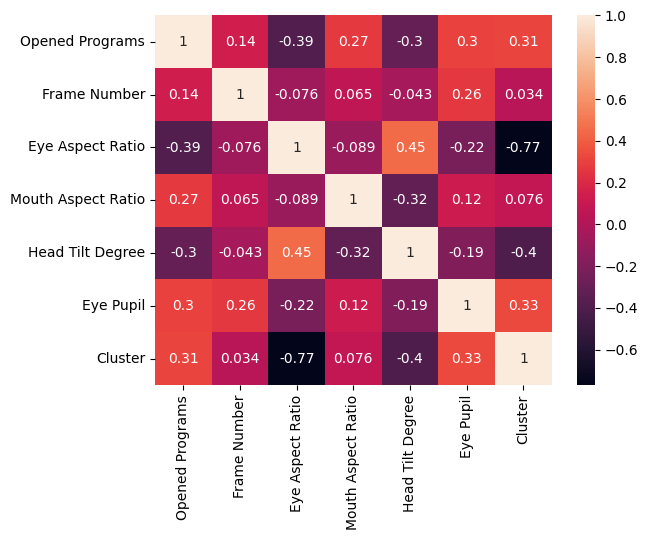

In [25]:
sns.heatmap(data=Train.corr(), annot=True)

In [26]:
Train

,Opened Programs,Frame Number,Eye Aspect Ratio,Mouth Aspect Ratio,Head Tilt Degree,Eye Pupil,Cluster
0,1,5,0.288029,0.683386,0.518621,0.581871,0
1,1,6,0.322586,0.651688,0.519213,0.594595,0
2,1,7,0.300121,0.673784,0.517741,0.573613,0
3,1,8,0.211984,0.669791,0.513557,0.646630,1
4,1,10,0.294013,0.641238,0.516439,0.611583,0
...,...,...,...,...,...,...,...
17381,24,1141,0.230269,0.688831,0.512022,0.739130,1
17382,24,1142,0.242374,0.682623,0.509564,0.739130,1
17383,24,1143,0.249508,0.702252,0.510734,0.717391,1
17384,24,1147,0.228655,0.717396,0.501630,0.733202,1


In [27]:
import pandas as pd
from sklearn.model_selection import train_test_split



X = Train.drop(['Cluster','Opened Programs','Frame Number'], axis=1)
y = Train['Cluster']
# Step 3: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)




In [28]:
import xgboost as xgb

xgb_classifier = xgb.XGBClassifier(objective="binary:logistic")

# Train the model on the training data
xgb_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = xgb_classifier.predict(X_test)

In [29]:
xgb_classifier.save_model('xgFIKO_classifier.model')

In [30]:
from sklearn.metrics import classification_report

# Classification report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4136
           1       0.99      0.99      0.99      1080

    accuracy                           0.99      5216
   macro avg       0.99      0.99      0.99      5216
weighted avg       0.99      0.99      0.99      5216



<AxesSubplot: xlabel='Predicted', ylabel='Actual'>

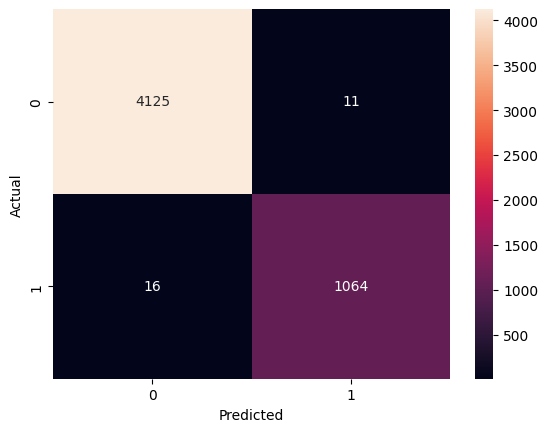

In [31]:
#Confusion matrix plotting
confusion_matrix = pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'])
sns.heatmap(confusion_matrix, annot=True,fmt='d')

In [46]:
Test = pd.read_csv('TestFIKO.csv')

In [47]:
Test

,Opened Programs,Frame Number,Eye Aspect Ratio,Mouth Aspect Ratio,Head Tilt Degree,Eye Pupil
0,1,0,0.324005,0.729011,0.512748,0.593353
1,1,1,0.312034,0.735683,0.512867,0.612903
2,1,2,0.323799,0.741631,0.512908,0.587198
3,1,3,0.305043,0.709644,0.512730,0.555444
4,1,4,0.309208,0.725820,0.512161,0.546875
...,...,...,...,...,...,...
2429,2,1219,0.214911,0.664929,0.489712,0.509881
2430,2,1220,0.210828,0.669932,0.492852,0.467262
2431,2,1221,0.209007,0.693199,0.496780,0.744565
2432,2,1222,0.188791,0.681571,0.493120,0.696970


In [48]:
Test=remove_outliers(Test,'Eye Aspect Ratio')
Test=remove_outliers(Test,'Mouth Aspect Ratio')
Test=remove_outliers(Test,'Head Tilt Degree')
Test=remove_outliers(Test,'Eye Pupil')

In [49]:

Test_new=Test.drop(['Opened Programs','Frame Number'],axis=1)
Test_pred=xgb_classifier.predict(Test_new)

In [50]:
Test_pred

array([0, 0, 0, ..., 1, 1, 1])

In [51]:
Test['Cluster']=Test_pred

In [52]:
Test

,Opened Programs,Frame Number,Eye Aspect Ratio,Mouth Aspect Ratio,Head Tilt Degree,Eye Pupil,Cluster
0,1,0,0.324005,0.729011,0.512748,0.593353,0
1,1,1,0.312034,0.735683,0.512867,0.612903,0
2,1,2,0.323799,0.741631,0.512908,0.587198,0
3,1,3,0.305043,0.709644,0.512730,0.555444,0
4,1,4,0.309208,0.725820,0.512161,0.546875,0
...,...,...,...,...,...,...,...
2423,2,1213,0.216438,0.705622,0.494882,0.687500,1
2424,2,1214,0.199737,0.701977,0.495916,0.681159,1
2431,2,1221,0.209007,0.693199,0.496780,0.744565,1
2432,2,1222,0.188791,0.681571,0.493120,0.696970,1


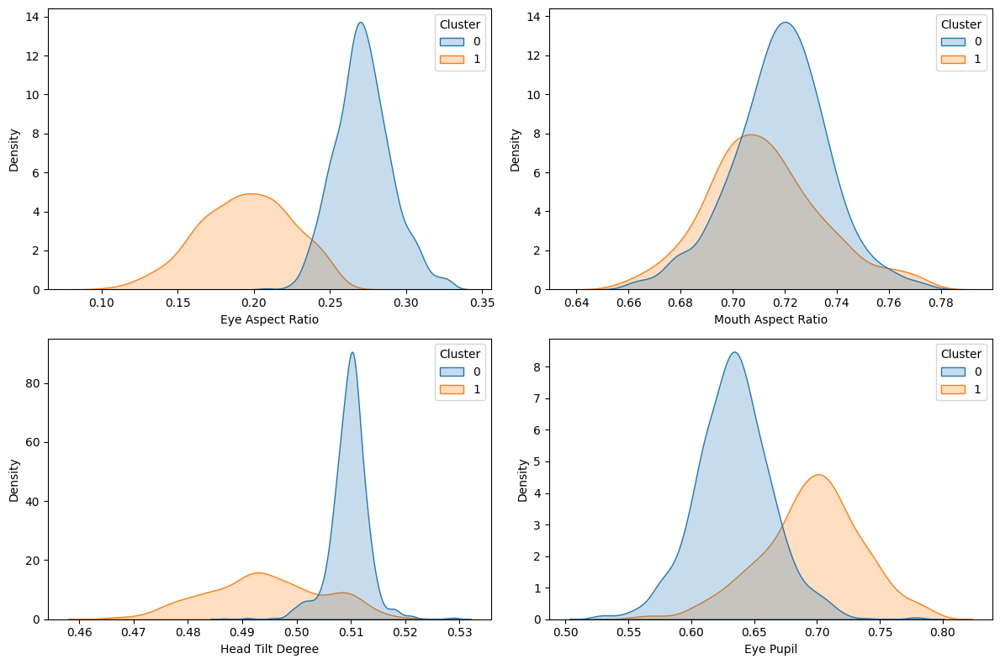

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have a Test DataFrame with the specified columns and 'Cluster' column
# Replace Test with your actual DataFrame and column names accordingly

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Plot the KDE plots in each subplot
sns.kdeplot(data=Test, x="Eye Aspect Ratio", hue="Cluster", fill=True, ax=axes[0, 0])

sns.kdeplot(data=Test, x="Mouth Aspect Ratio", hue="Cluster", fill=True, ax=axes[0, 1])

sns.kdeplot(data=Test, x="Head Tilt Degree", hue="Cluster", fill=True, ax=axes[1, 0])

sns.kdeplot(data=Test, x="Eye Pupil", hue="Cluster", fill=True, ax=axes[1, 1])

# Adjust layout
plt.tight_layout()

# Show the subplots
plt.show()


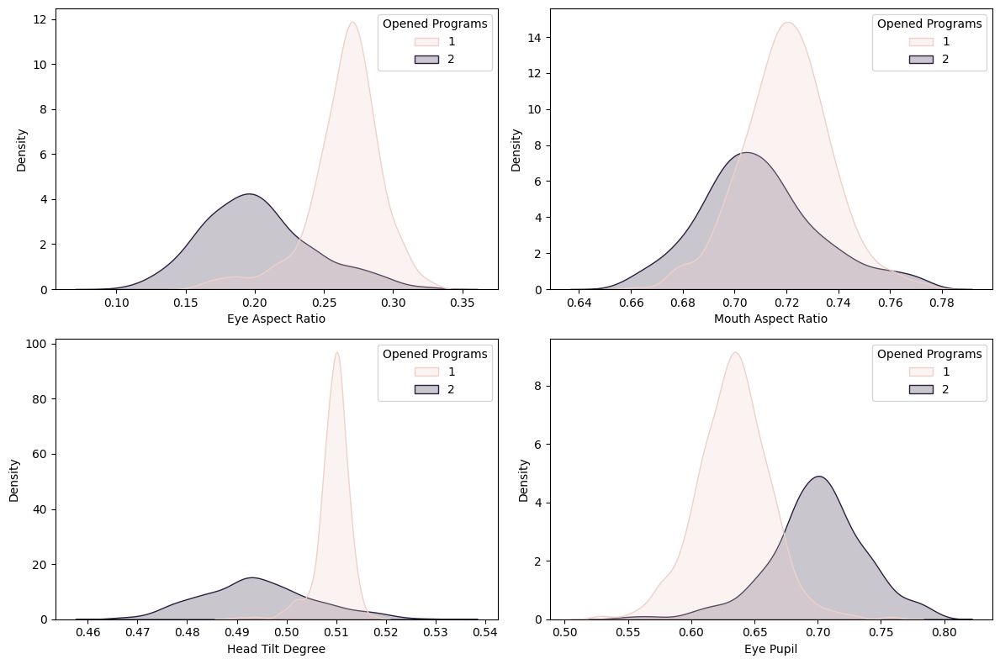

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have a Test DataFrame with the specified columns and 'Cluster' column
# Replace Test with your actual DataFrame and column names accordingly

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Plot the KDE plots in each subplot
sns.kdeplot(data=Test, x="Eye Aspect Ratio", hue="Opened Programs", fill=True, ax=axes[0, 0])

sns.kdeplot(data=Test, x="Mouth Aspect Ratio", hue="Opened Programs", fill=True, ax=axes[0, 1])

sns.kdeplot(data=Test, x="Head Tilt Degree", hue="Opened Programs", fill=True, ax=axes[1, 0])

sns.kdeplot(data=Test, x="Eye Pupil", hue="Opened Programs", fill=True, ax=axes[1, 1])

# Adjust layout
plt.tight_layout()

# Show the subplots
plt.show()


In [55]:

# Choose the specific "Opened Programs" value for which you want to calculate the percentage
target_opened_program = 1  # Replace with the desired "Opened Programs" value

# Filter the DataFrame for the specified "Opened Programs" value
filtered_df = Test[Test['Opened Programs'] == target_opened_program]

# Calculate the percentage of observations in Cluster 0
cluster_0_percentage = (filtered_df['Cluster'] == 0).sum() / len(filtered_df) * 100

# Print the result
print(f"The percentage of observations in Cluster 0 for Opened Programs {target_opened_program}: {cluster_0_percentage:.2f}%")


The percentage of observations in Cluster 0 for Opened Programs 1: 89.92%


In [56]:

# Choose the specific "Opened Programs" value for which you want to calculate the percentage
target_opened_program = 2  # Replace with the desired "Opened Programs" value

# Filter the DataFrame for the specified "Opened Programs" value
filtered_df = Test[Test['Opened Programs'] == target_opened_program]

# Calculate the percentage of observations in Cluster 0
cluster_0_percentage = (filtered_df['Cluster'] == 0).sum() / len(filtered_df) * 100

# Print the result
print(f"The percentage of observations in Cluster 0 for Opened Programs {target_opened_program}: {cluster_0_percentage:.2f}%")


The percentage of observations in Cluster 0 for Opened Programs 2: 10.55%
